# Vanilla Diffusion

**Statement of Purpose**

The goal of this notebook is to gain a hands-on introduction to the foundational and conceptual notions of what makes a Diffusion Neural Network a viable image synthesis machine. The basic concept involves:
- forward process (noise scheduling)
- backward process (U-Net learning)
- loss (simplified variational lower bound)
- sampling
- training

Tutorial inspired by: https://www.youtube.com/watch?v=a4Yfz2FxXiY&t=178s

# Step 0: Load Libraries

In [1]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch import nn
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau

import matplotlib.pyplot as plt
import kagglehub
from torch.utils.data import Dataset
from PIL import Image
import os
import numpy as np
import math
import tqdm
import datetime
import glob

# Define some global variables
IMG_SIZE = 64
BATCH_SIZE = 128
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# Set random seed
torch.manual_seed(7242025)

Using device: cuda


# Step 1: Data Analysis

First, let's introduce and examine our dataset. For this initial notebook, we'll use a 60k car dataset from kaggle. Let's download the data.

In [2]:
# Download latest version
path = kagglehub.dataset_download("prondeau/the-car-connection-picture-dataset")
print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/prondeau/the-car-connection-picture-dataset/versions/1


With the data downloaded, we need to create an image class. Most notably, we resize each image and rescale the pixel values on the domain $[-1, 1]$ from $[0, 255]$. Why is this important? Two reasons:

1. Numerical stability
2. Standard Gaussian noise assumes $\mathcal{N}(0, 1)$

That is, we would like our eventually generated noise to be centered at 0 with unit variance, so this rescaling needs to match.

In [3]:
import random

class CarDataset(Dataset):
    def __init__(self, image_dir, num_images=10000):
        self.image_dir = image_dir
        all_image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)]
        self.image_paths = random.sample(all_image_paths, min(num_images, len(all_image_paths)))
        self.transform = transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ToTensor(),
            transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image

Now we can load the data properly and visualize!

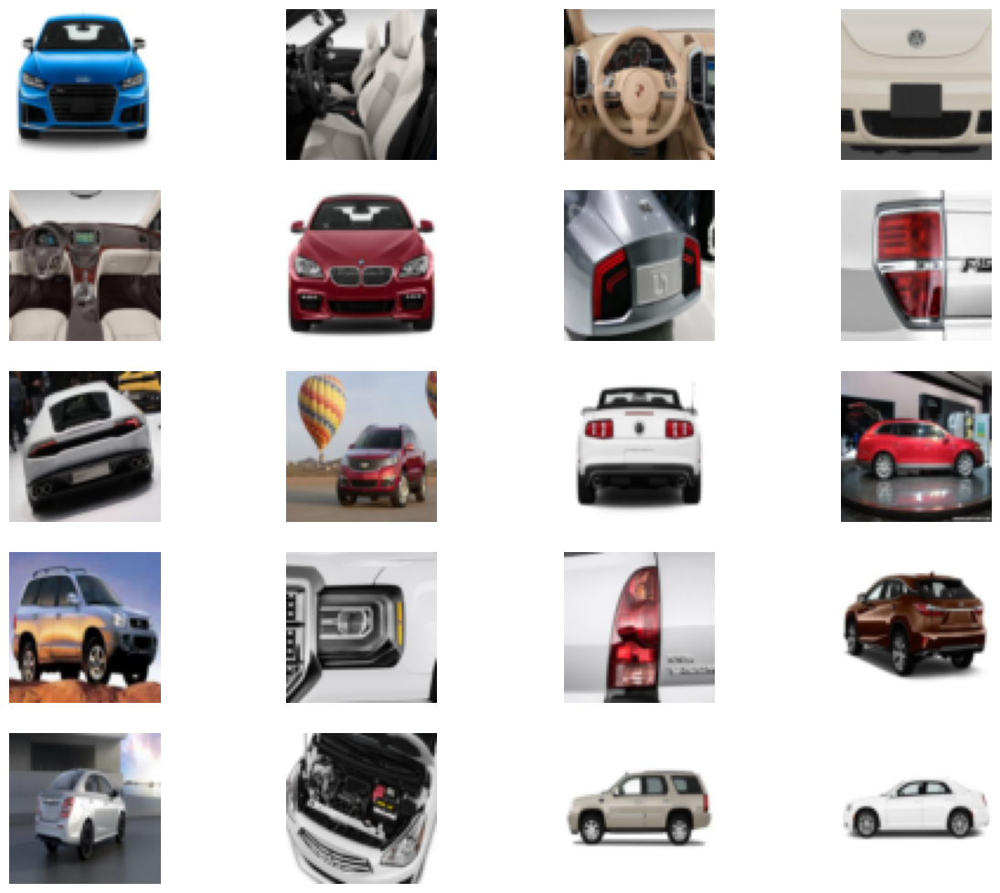

In [4]:
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image.cpu()))

# Show images from dataset
def show_images(dataset, num_samples=20, cols=4):
    loader = DataLoader(dataset, batch_size=num_samples, shuffle=True)
    images = next(iter(loader))

    plt.figure(figsize=(15,15))
    for i in range(num_samples):
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)

        show_tensor_image(images[i])
        plt.axis("off")
    plt.show()

# Build data loader and show sample images
data = CarDataset(path)
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
show_images(data)

# Step 2: Forward Process (Noise Scheduler)

The forward process is a Markov Chain that adds noise to the image at each timestep. It is typically written as:

\begin{align}
q(x_{1:T} \mid x_0) = \prod_{t=1}^T q(x_t \mid x_{t-1})
\end{align}


The general process is as follows, where we start at $t = 1$:
- Sample $x_t$ ~ $q(x_t | x_{t - 1})$
- Increment $t$ by 1
- Terminate when $t = T$

For this introductory tutorial, we will use a linear Gaussian noise scheduling scheme for simplicity. Other possible schemes may be cosine, sigmoid, or exponential scheduling, which will be explored in a different notebook.

In general, Gaussian noise scheduling is typically of the form:

\begin{align}
q(x_t \mid x_{t-1}) = \mathcal{N}(x_t; \sqrt{1 - \beta_t} \, x_{t-1}, \beta_t \, \mathbf{I})
\end{align}

In other words, noise is sampled at each timestep $t$ is from a Gaussian distribution with:
- mean: $\sqrt{1 - \beta_t} \, x_{t-1}$
- variance: $\beta_t \, \mathbf{I}$

Note that the scheduled noise is represented by $\beta_t$.

In [5]:
# Simple linear noise scheduler with:
# - start: 0.0001
# - end:   0.02
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

Interestingly, by formalizing the Guassian noise scheme in this way, we can develop a closed form expression for the sampled noise at each time step conditioned on the original image:

\begin{align}
q(x_t \mid x_0) = \mathcal{N}(x_t; \sqrt{\bar{\alpha}_t} \, x_0, (1 - \bar{\alpha}_t) \, \mathbf{I}),
\end{align}

where $\bar{\alpha}_t = \prod_{s=1}^t (1 - \beta_s)$. That is, $\bar{\alpha}_t$ is the "history" of retained signal (how much of the original image is still present) recursively multiplied together.

In [6]:
def compute_cumulative_product(betas):
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    return alphas, alphas_cumprod

We finally arrive at the complete formulation of a single forward diffusion step. Recall that sampling from a Gaussian $\mathcal{N}(μ,σ^2I)$ is:

\begin{align}
x=μ+σ⋅ϵ, \text{ } ϵ~N(0,I).
\end{align}

Therefore, we sample as thus:

\begin{align}
x_t = x_0 \sqrt{\bar{\alpha}_t} + \epsilon \sqrt{1 - \bar{\alpha}_t}
\end{align}

In [7]:
# Retrieves the value in the source tensor
# for the current timestep
def get_current_timestep_value(src_tensor, t, x_shape):
    batch_size = t.shape[0]
    out = src_tensor.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

# Completes a single forward diffusion step
# for a given image x_0
# at timestep t
def forward_diffusion_step(x_0, t, sqrt_cumprod, sqrt_one_minus_cumprod, device=DEVICE):
    # epsilon <=> noise
    epsilon = torch.randn_like(x_0)

    # compute x_t
    sqrt_cumprod_t = get_current_timestep_value(sqrt_cumprod, t, x_0.shape)
    sqrt_one_minus_cumprod_t = get_current_timestep_value(
        sqrt_one_minus_cumprod, t, x_0.shape
    )
    x_t = sqrt_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_cumprod_t.to(device) * epsilon.to(device)

    return x_t, epsilon

Now, let's test our diffusion process on our dataset to verify it works!

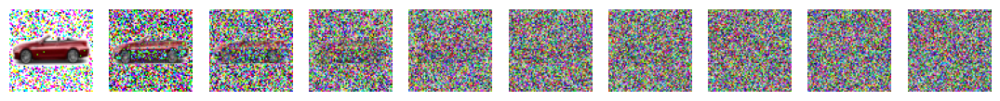

In [8]:
# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-compute necessary cumulative products
alphas, alphas_cumprod = compute_cumulative_product(betas)
sqrt_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_cumprod = torch.sqrt(1. - alphas_cumprod)

# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_step(image, t, sqrt_cumprod, sqrt_one_minus_cumprod)
    show_tensor_image(img)
    plt.axis('off')

Awesome! It looks like our forward process is working quite nicely! Let's now move on to the backward process i.e., learning to undo the noise diffusion.

# Step 3: Backward Process (U-Net Learning)

The purpose of any U-Net is to take an image input and transform it. Example use-cases include image segmentation and object detection. For our case, in generative diffusion modeling, we want to take a noisy image as input, and identify the noise in the image (such that removing said noise would produce the clean image).

Before we explore the U-Net architecture, one thing to note is that model parameters are shared across time, so we need a way to tell the network which timestep we are in so that it learns the noise at each time iteration (granularity). To do so, we use a concept introduced in the Transformer architecture: Positional Embeddings. In our case, we use the Sinusoidal Positional Embeddings, which encode the timestep $t$ into a fixed-dimensional vector using a combination of sine and cosine functions at different frequencies. Mathematically, for a timestep $t$ and embedding dimension $d$, the embedding is defined as:

\begin{align}
\text{PE}_{(t, 2i)} = \sin\left( \frac{t}{n^{2i / d}} \right), \quad
\text{PE}_{(t, 2i+1)} = \cos\left( \frac{t}{n^{2i / d}} \right)
\end{align}

for $i = 0, 1, ..., \frac{d}{2} - 1$. This results in a vector of length $d$, where each dimension corresponds to a sinusoidal function with a different frequency.

These embeddings provide the model with a smooth, continuous representation of time and allow it to learn time-dependent behavior without explicitly using different weights at each timestep. Unlike learned embeddings, sinusoidal embeddings generalize to unseen timesteps and provide natural inductive bias for periodicity or progression.

In [9]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time, device=DEVICE):
        n = 10000
        half_dim = self.dim // 2
        embeddings = math.log(n) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

Just as a side note, it is clever to perform calculations on the log-scale when working with very large (or very small) numbers. As such, the above code is not written in the same form as the original expression for two reasons:

- Computing $log(n)$ and exponentiating is more stable than computing $n^{small\_exponent}$ directly.
- Reduces the risk of numerical overflow

The U-Net's signature Double Convolution Block is used in both downsampling and upsampling stages, with spatial resolutions transformed by convolutions and transposed convolutions, respectively. Batch normalization is used to maintain stable gradient flow. Note that the time embedding is a simple linear projection from the embedding dimension to the number of output channels (3). When added to the first convolution operation, it acts as a learnable per-channel bias based on the current timestep.

In [10]:
class DoubleConvolutionBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First convolution operation
        operation1 = self.bnorm1(self.relu(self.conv1(x)))

        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]

        # Add time channel
        operation1 = operation1 + time_emb

        # Second convolution operation
        operation2 = self.bnorm2(self.relu(self.conv2(operation1)))

        # Down or Upsample
        return self.transform(operation2)

With the building blocks established, we now define a standard U-Net architecture as follows:
- Input: 3 channels (RGB) colored noisy image
- Encoder: Feature abstraction from downsampling w/ double convolution blocks and pooling
- Bottleneck: "Middle" of the network, performing one final double convolution block and doubling the feature map size to extract an expanded, high-level, latent representation.
- Decoder: Feature reconstruction from upsampling w/ transposed convolution and double convolution blocks
- Output: 3 channels (RGB) colored noise

Note, vanilla U-Net uses long-skip connections between corresponding downsampling (encoding) and upsampling steps to provide contextual information when decoding.

In [11]:
class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([DoubleConvolutionBlock(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([DoubleConvolutionBlock(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Time Embedding
        t = self.time_mlp(timestep)
        # Initial convolution
        x = self.conv0(x)

        # U-Net Downsampling
        skip_connections = []
        for down in self.downs:
            x = down(x, t)
            skip_connections.append(x)

        # U-Net Upsampling
        for up in self.ups:
            skip = skip_connections.pop()

            # Add long-skip connections as additional channels
            x = torch.cat((x, skip), dim=1)
            x = up(x, t)

        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): DoubleConvolutionBlock(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): DoubleConvolutionBlock(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1

# Step 4: Loss Function (Variational Lower Bound)

For this introductory notebook, we use a simple loss function, which essentially scores the model based on predicted noise vs acual noise level. The definition is:

\begin{align}
\mathcal{L}_{\text{simple}} = \mathbb{E}_{x_0, \epsilon, t} \left[ \left\| \epsilon - \epsilon_\theta(x_t, t) \right\|_2^2 \right]
\end{align}

Where:
- $x_0 \sim q(x_0)$ is a clean image from the data distribution  
- $\epsilon \sim \mathcal{N}(0, \mathbf{I})$ is standard Gaussian noise  
- $t \sim \text{Uniform}(\{1, \dots, T\})$ is a random timestep  
- $ x_t = \sqrt{\bar{\alpha}_t} \, x_0 + \sqrt{1 - \bar{\alpha}_t}, \epsilon$ is the noisy image at timestep $t$
- $\epsilon_\theta(x_t, t)$ is the model's predicted noise given the noisy image and timestep

In [12]:
def compute_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_step(x_0, t, sqrt_cumprod, sqrt_one_minus_cumprod)
    noise_pred = model(x_noisy, t)
    return F.mse_loss(noise_pred, noise)

# Step 5: Sampling Method

Before we can train our model, we need a way to sample from our training scheme to compute iterative loss. The process is fairly straightforward:

\begin{align}
x_{t-1} = \frac{1}{\sqrt{\alpha_t}} \left( x_t - \frac{1 - \alpha_t}{\sqrt{1 - \bar{\alpha}_t}} \cdot \epsilon_\theta(x_t, t) \right) + \sigma_t z
\end{align}

where:
- $\epsilon_\theta(x_t, t)$ is the predicted noise at timestep $t$ from the model
- $\alpha_t = 1 - \beta_t$
- $\bar{\alpha}_t = \prod_{s=1}^{t} \alpha_s$
- $\sigma_t^2 = \beta_t$ (basic variance schedule)
- $z \sim \mathcal{N}(0, I)$ if t > 1; $z = 0$ if $t = 1$

In other words, starting at the most noisy image $x_T \sim \mathcal{N}(O, I)$,
1. Predict the noise from the model
2. Estimate the mean of the posterior distribution from the predicted noise to approximate the reverse of the forward process
3. Sample the next image by adding posterior variance
4. Repeat until the first timestep (without adding noise).

NOTE: the posterior distribution, in our case, refers to the probability of the previous (time-sequential) image $x_{t-1}$, given the current relatively more noisy image $x_t$ and the original clean image $x_0$.

NOTE: when coding this up, torch.no_grad() is essential in order to not overflow the memory! We don't need to track anything when sampling images. Additionally, as with the diffusion step, it is useful to pre-compute some of the alpha-based timestep values to avoid repeated computation.

In [25]:
# Pre-compute alpha terms
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

# Returns denoised image
@torch.no_grad()
def sample_image_at_timestep(x, t):
    # Get pre-computed timestep values
    betas_t = get_current_timestep_value(betas, t, x.shape)
    sqrt_recip_alphas_t = get_current_timestep_value(sqrt_recip_alphas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_current_timestep_value(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )

    # Compute mean of posterior distribution
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )

    # Get variance of posterior distribution
    posterior_variance_t = get_current_timestep_value(posterior_variance, t, x.shape)

    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

# Sample images at each major timestep and plot the result
@torch.no_grad()
def sample_and_plot_image():
    # Sample a completely noisy image
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=DEVICE)
    plt.figure(figsize=(15,15))
    num_images = 10
    stepsize = int(T/num_images)

    # Reverse diffusion sampling process
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=DEVICE, dtype=torch.long)
        img = sample_image_at_timestep(img, t)

        # Use clamp to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
            plt.axis('off')
    plt.show()

# Step 6: Training

Finally, we enter our training stage. We will perform mini-batch iterations for faster, parallelizable training. The process is thankfully straightforward:

Per mini-batch:
- Start with a random timestep
- Compute loss
- Update parameters
- Visualize model performance every 5 epochs

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 | Avg Loss: 0.2714


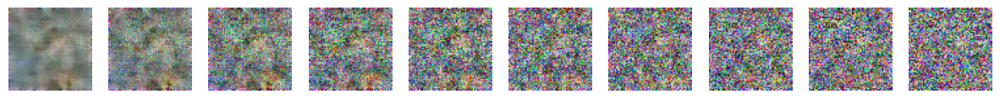

Epoch 1 | Avg Loss: 0.1267


Epoch 2 | Avg Loss: 0.0840


Epoch 3 | Avg Loss: 0.0705


Epoch 4 | Avg Loss: 0.0641


Epoch 5 | Avg Loss: 0.0608


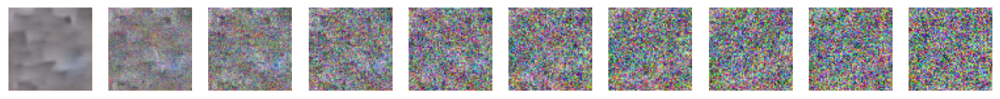

Epoch 6 | Avg Loss: 0.0591


Epoch 7 | Avg Loss: 0.0576


Epoch 8 | Avg Loss: 0.0576


Epoch 9 | Avg Loss: 0.0551


Epoch 10 | Avg Loss: 0.0538


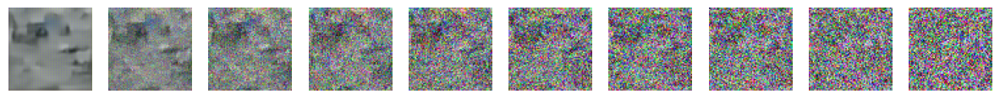

Epoch 11 | Avg Loss: 0.0536


Epoch 12 | Avg Loss: 0.0528


Epoch 13 | Avg Loss: 0.0523


Epoch 14 | Avg Loss: 0.0515


Epoch 15 | Avg Loss: 0.0525


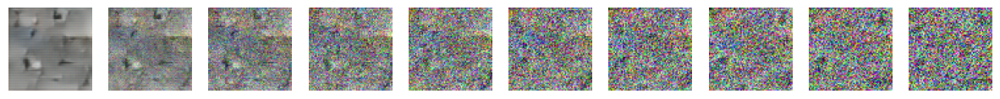

Epoch 16 | Avg Loss: 0.0506


Epoch 17 | Avg Loss: 0.0508


Epoch 18 | Avg Loss: 0.0494


Epoch 19 | Avg Loss: 0.0487


Epoch 20 | Avg Loss: 0.0495


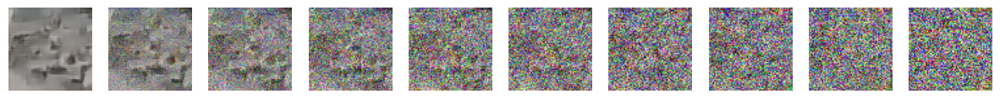

Epoch 21 | Avg Loss: 0.0492


Epoch 22 | Avg Loss: 0.0493


Epoch 23 | Avg Loss: 0.0475


Epoch 24 | Avg Loss: 0.0472


Epoch 25 | Avg Loss: 0.0490


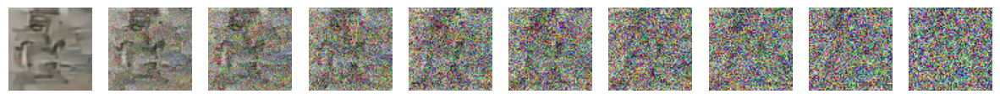

Epoch 26 | Avg Loss: 0.0467


Epoch 27 | Avg Loss: 0.0462


Epoch 28 | Avg Loss: 0.0458


Epoch 29 | Avg Loss: 0.0463


Epoch 30 | Avg Loss: 0.0467


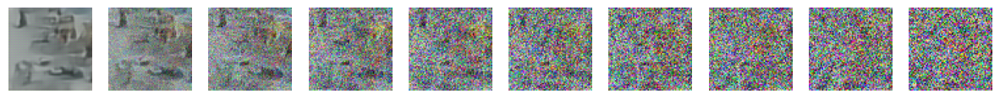

Epoch 31 | Avg Loss: 0.0459


Epoch 32 | Avg Loss: 0.0456


Epoch 33 | Avg Loss: 0.0457


Epoch 34 | Avg Loss: 0.0454


Epoch 35 | Avg Loss: 0.0444


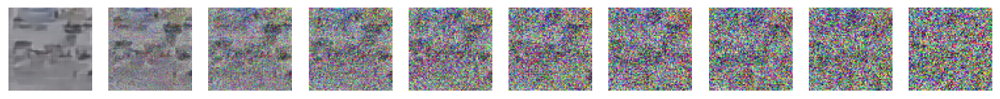

Epoch 36 | Avg Loss: 0.0452


Epoch 37 | Avg Loss: 0.0451


Epoch 38 | Avg Loss: 0.0443


Epoch 39 | Avg Loss: 0.0436


Epoch 40 | Avg Loss: 0.0438


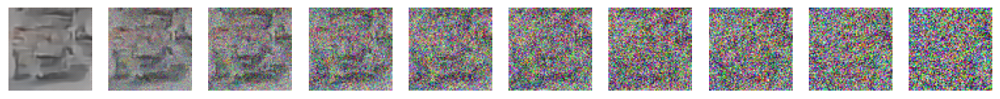

Epoch 41 | Avg Loss: 0.0443


Epoch 42 | Avg Loss: 0.0438


Epoch 43 | Avg Loss: 0.0431


Epoch 44 | Avg Loss: 0.0417


Epoch 45 | Avg Loss: 0.0441


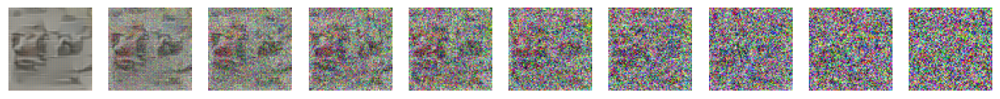

Epoch 46 | Avg Loss: 0.0419


Epoch 47 | Avg Loss: 0.0409


Epoch 48 | Avg Loss: 0.0421


Epoch 49 | Avg Loss: 0.0418


Epoch 50 | Avg Loss: 0.0420


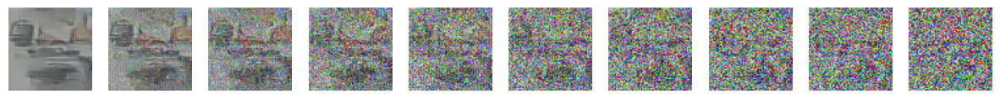

Epoch 51 | Avg Loss: 0.0406


Epoch 52 | Avg Loss: 0.0418


Epoch 53 | Avg Loss: 0.0407


Epoch 54 | Avg Loss: 0.0414


Epoch 55 | Avg Loss: 0.0407


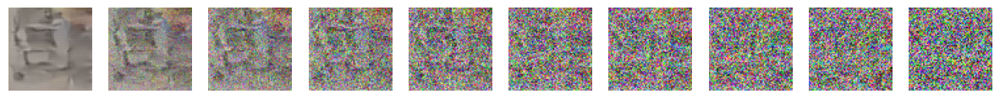

Epoch 56 | Avg Loss: 0.0396


Epoch 57 | Avg Loss: 0.0413


Epoch 58 | Avg Loss: 0.0410


Epoch 59 | Avg Loss: 0.0401


Epoch 60 | Avg Loss: 0.0408


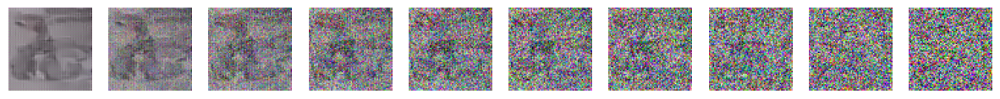

Epoch 61 | Avg Loss: 0.0404


Epoch 62 | Avg Loss: 0.0395


Epoch 63 | Avg Loss: 0.0401


Epoch 64 | Avg Loss: 0.0400


Epoch 65 | Avg Loss: 0.0397


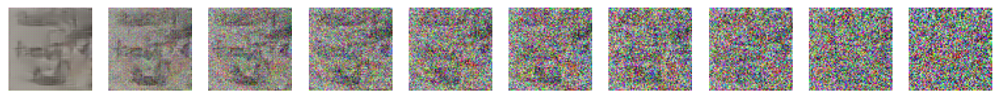

Epoch 66 | Avg Loss: 0.0387


Epoch 67 | Avg Loss: 0.0396


Epoch 68 | Avg Loss: 0.0389


Epoch 69 | Avg Loss: 0.0389


Epoch 70 | Avg Loss: 0.0378


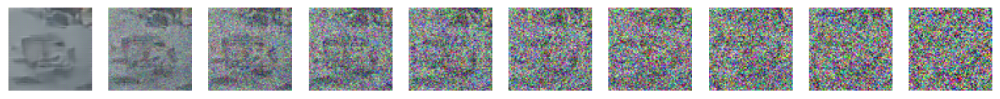

Epoch 71 | Avg Loss: 0.0390


Epoch 72 | Avg Loss: 0.0386


Epoch 73 | Avg Loss: 0.0370


Epoch 74 | Avg Loss: 0.0381


Epoch 75 | Avg Loss: 0.0386


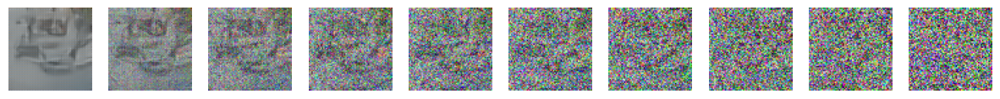

Epoch 76 | Avg Loss: 0.0385


Epoch 77 | Avg Loss: 0.0382


Epoch 78 | Avg Loss: 0.0378


Epoch 79 | Avg Loss: 0.0369


Epoch 80 | Avg Loss: 0.0375


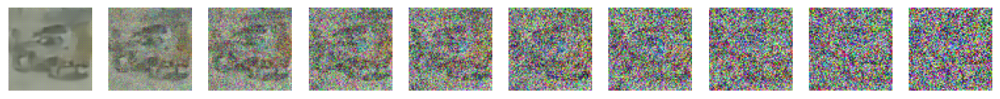

Epoch 81 | Avg Loss: 0.0364


Epoch 82 | Avg Loss: 0.0372


Epoch 83 | Avg Loss: 0.0367


Epoch 84 | Avg Loss: 0.0376


Epoch 85 | Avg Loss: 0.0381


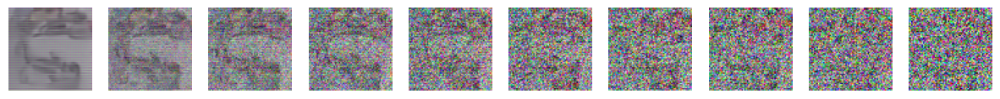

Epoch 86 | Avg Loss: 0.0367


Epoch 87 | Avg Loss: 0.0376


Epoch 88 | Avg Loss: 0.0357


Epoch 89 | Avg Loss: 0.0355


Epoch 90 | Avg Loss: 0.0351


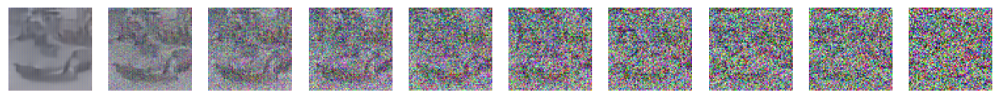

Epoch 91 | Avg Loss: 0.0355


Epoch 92 | Avg Loss: 0.0350


Epoch 93 | Avg Loss: 0.0354


Epoch 94 | Avg Loss: 0.0365


Epoch 95 | Avg Loss: 0.0363


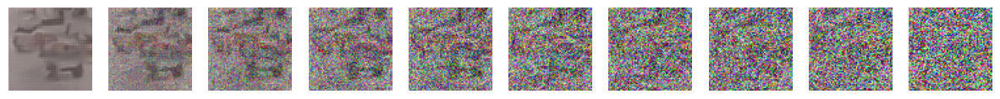

Epoch 96 | Avg Loss: 0.0352


Epoch 97 | Avg Loss: 0.0352


Epoch 98 | Avg Loss: 0.0361


Epoch 99 | Avg Loss: 0.0348


In [ ]:
model.to(DEVICE)
optimizer = Adam(model.parameters(), lr=1e-3)
epochs = 100

# Add learning rate scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

epoch_training_loss = []

for epoch in range(epochs):
    model.train()
    epoch_loss = 0
    num_batches = 0

    for batch in tqdm.tqdm(dataloader, desc=f"Epoch {epoch}", leave=False):
        optimizer.zero_grad()

        images = batch if isinstance(batch, torch.Tensor) else batch[0]
        images = images.to(DEVICE)

        t = torch.randint(0, T, (images.size(0),), device=DEVICE).long()
        loss = compute_loss(model, images, t)

        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()
        num_batches += 1

    avg_loss = epoch_loss / num_batches
    epoch_training_loss.append(avg_loss)
    print(f"Epoch {epoch} | Avg Loss: {avg_loss:.4f}")

    # Step the learning rate scheduler
    scheduler.step(avg_loss)

    if epoch % 5 == 0:
        sample_and_plot_image()

It's important to save your model so that you can continue training if needed without having to restart.

In [ ]:
# Define the directory to save model checkpoints
checkpoint_dir = "Model Checkpoints"

# Create the directory if it doesn't exist
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

# Get current date and time
now = datetime.datetime.now()
timestamp = now.strftime("%Y%m%d_%H%M%S")

# Define filename
filename = f"unet_model_checkpoint_{timestamp}.pth"
filepath = os.path.join(checkpoint_dir, filename)

# Create a dictionary to save
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': avg_loss
}

# Save the checkpoint
torch.save(checkpoint, filepath)

print(f"Model and optimizer states saved to {filepath}")

Model and optimizer states saved to Model Checkpoints/unet_model_checkpoint_20250727_032444.pth


Let's examine the loss to see if our average training loss per epoch continues to decrease.

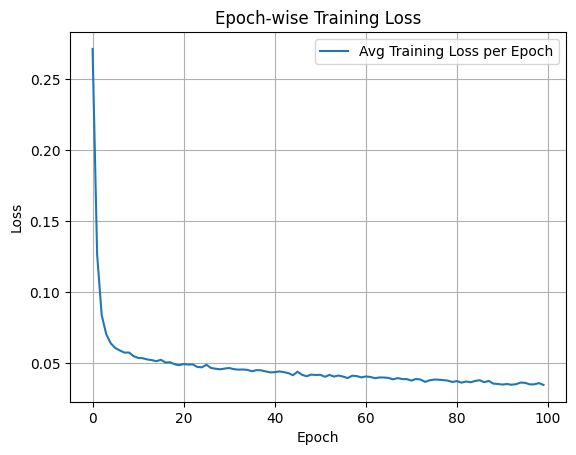

In [ ]:
plt.plot(epoch_training_loss, label="Avg Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Epoch-wise Training Loss")
plt.grid(True)
plt.legend()
plt.show()

# Step 7: Checkpointed Training

Now that we have established our model is beginning to produce something, and have also verified that our loss continues to decrease, let's continue training our model for another 50 epochs and see if we can do really good!

Loading checkpoint from Model Checkpoints/unet_model_checkpoint_20250727_032444.pth


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Resuming training from epoch 100 with loss 0.0348


Epoch 100 | Avg Loss: 0.0356


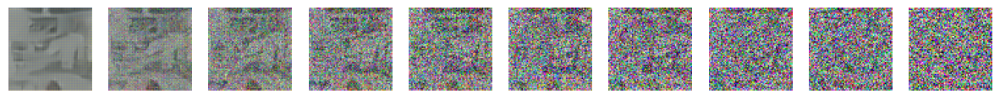

Epoch 101 | Avg Loss: 0.0350


Epoch 102 | Avg Loss: 0.0358


Epoch 103 | Avg Loss: 0.0356


Epoch 104 | Avg Loss: 0.0351


Epoch 105 | Avg Loss: 0.0352


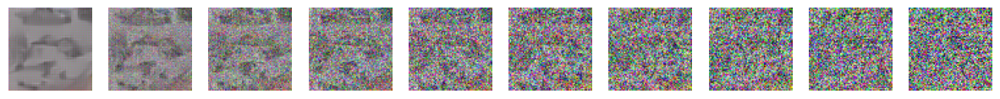

Epoch 106 | Avg Loss: 0.0357


Epoch 107 | Avg Loss: 0.0352


Epoch 108 | Avg Loss: 0.0362


Epoch 109 | Avg Loss: 0.0352


Epoch 110 | Avg Loss: 0.0352


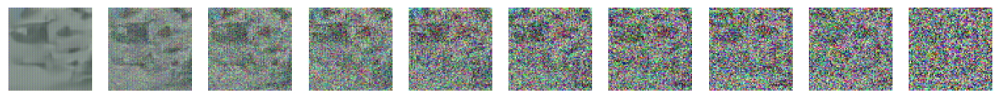

Epoch 111 | Avg Loss: 0.0353


Epoch 112 | Avg Loss: 0.0352


Epoch 113 | Avg Loss: 0.0357


Epoch 114 | Avg Loss: 0.0353


Epoch 115 | Avg Loss: 0.0363


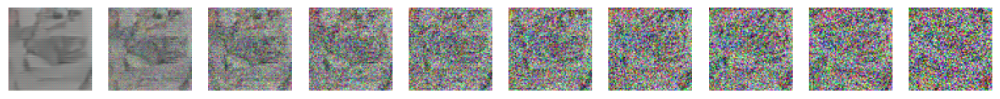

Epoch 116 | Avg Loss: 0.0357


Epoch 117 | Avg Loss: 0.0357


Epoch 118 | Avg Loss: 0.0349


Epoch 119 | Avg Loss: 0.0355


Epoch 120 | Avg Loss: 0.0358


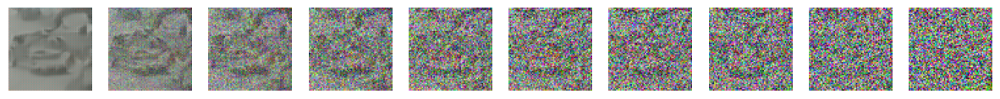

Epoch 121 | Avg Loss: 0.0358


Epoch 122 | Avg Loss: 0.0358


Epoch 123 | Avg Loss: 0.0351


Epoch 124 | Avg Loss: 0.0348


Epoch 125 | Avg Loss: 0.0366


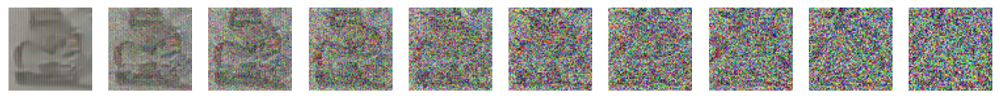

Epoch 126 | Avg Loss: 0.0357


Epoch 127 | Avg Loss: 0.0352


Epoch 128 | Avg Loss: 0.0349


Epoch 129 | Avg Loss: 0.0354


Epoch 130 | Avg Loss: 0.0360


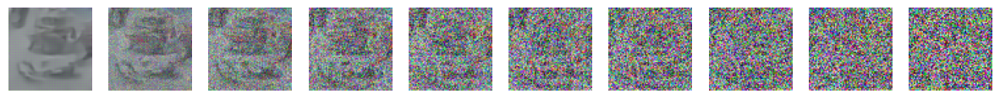

Epoch 131 | Avg Loss: 0.0354


Epoch 132 | Avg Loss: 0.0355


Epoch 133 | Avg Loss: 0.0355


Epoch 134 | Avg Loss: 0.0358


Epoch 135 | Avg Loss: 0.0351


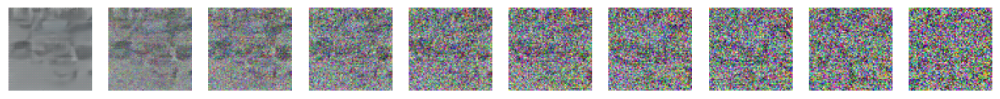

Epoch 136 | Avg Loss: 0.0363


Epoch 137 | Avg Loss: 0.0358


Epoch 138 | Avg Loss: 0.0362


Epoch 139 | Avg Loss: 0.0359


Epoch 140 | Avg Loss: 0.0357


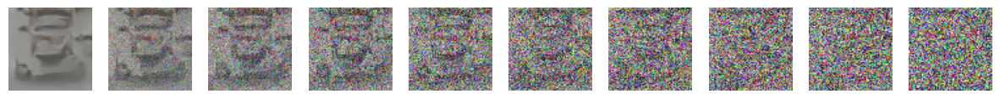

Epoch 141 | Avg Loss: 0.0361


Epoch 142 | Avg Loss: 0.0351


Epoch 143 | Avg Loss: 0.0355


Epoch 144 | Avg Loss: 0.0348


Epoch 145 | Avg Loss: 0.0368


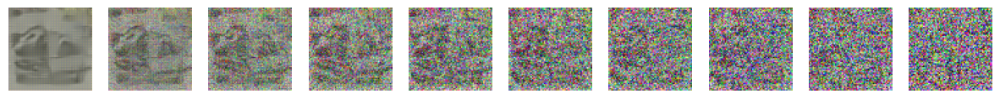

Epoch 146 | Avg Loss: 0.0352


Epoch 147 | Avg Loss: 0.0345


Epoch 148 | Avg Loss: 0.0354


Epoch 149 | Avg Loss: 0.0355
Training finished.


In [15]:
# Define the directory where we save model checkpoints
checkpoint_dir = "Model Checkpoints"

# Find the latest checkpoint file
list_of_files = glob.glob(os.path.join(checkpoint_dir, '*.pth'))
if not list_of_files:
    print("No checkpoints found to resume training.")
else:
    latest_file = max(list_of_files, key=os.path.getctime)
    print(f"Loading checkpoint from {latest_file}")

    # Load the checkpoint
    checkpoint = torch.load(latest_file)

    # Load model and optimizer states
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer = Adam(model.parameters(), lr=1e-3)
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    avg_loss = checkpoint['loss']

    print(f"Resuming training from epoch {start_epoch} with loss {avg_loss:.4f}")

    # Move model to device
    model.to(DEVICE)

    # Re-initialize the learning rate scheduler (or load its state if saved)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

    # Continue training for an additional 50 epochs
    additional_epochs = 50
    total_epochs = start_epoch + additional_epochs

    # Extend the epoch_training_loss list if it exists
    if 'epoch_training_loss' not in locals():
        epoch_training_loss = []

    for epoch in range(start_epoch, total_epochs):
        model.train()
        epoch_loss = 0
        num_batches = 0

        for batch in tqdm.tqdm(dataloader, desc=f"Epoch {epoch}", leave=False):
            optimizer.zero_grad()

            images = batch if isinstance(batch, torch.Tensor) else batch[0]
            images = images.to(DEVICE)

            t = torch.randint(0, T, (images.size(0),), device=DEVICE).long()
            loss = compute_loss(model, images, t)

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            num_batches += 1

        avg_loss = epoch_loss / num_batches
        epoch_training_loss.append(avg_loss)
        print(f"Epoch {epoch} | Avg Loss: {avg_loss:.4f}")

        # Step the learning rate scheduler
        scheduler.step(avg_loss)

        if epoch % 5 == 0:
            sample_and_plot_image()

    print("Training finished.")

Let's re-assess our loss graph to determine if we need to keep training or if we have plateued.

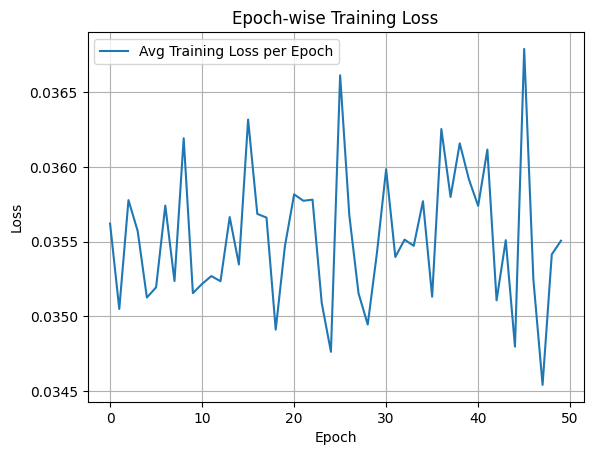

In [16]:
plt.plot(epoch_training_loss, label="Avg Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Epoch-wise Training Loss")
plt.grid(True)
plt.legend()
plt.show()

Based on the graph, over 50 extended training epochs, it seems we have unfortunately plateued. This can be a result of only using 10k images in the training data, weak u-net model, and unoptimized learning. We will not continue training, but let's take a look at some model results.

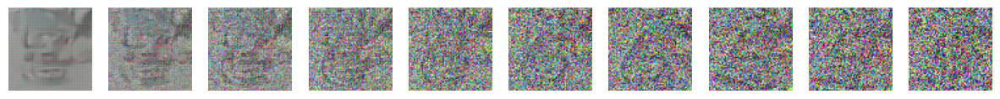

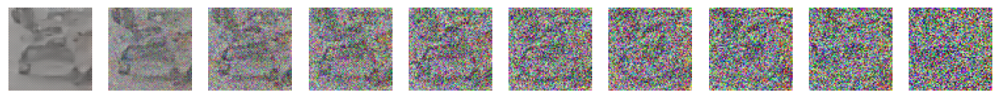

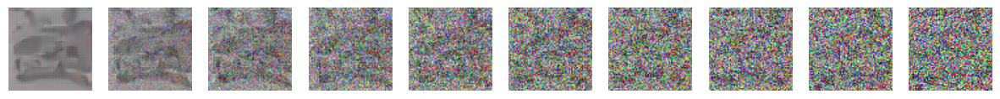

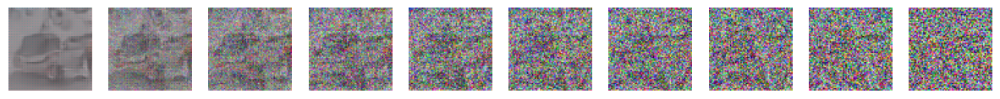

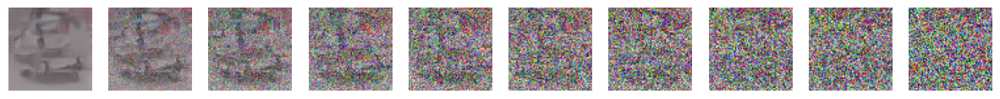

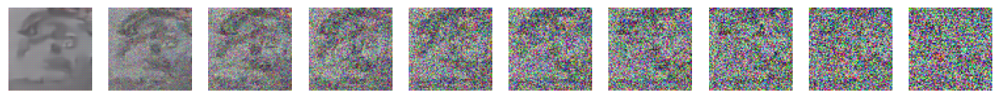

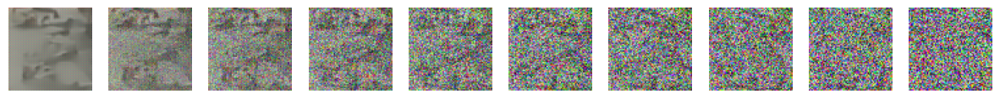

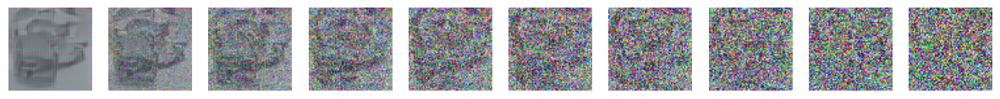

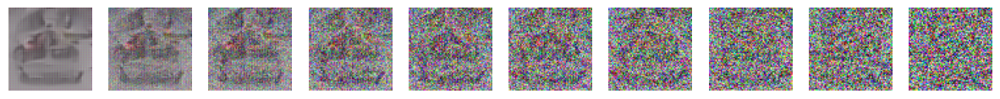

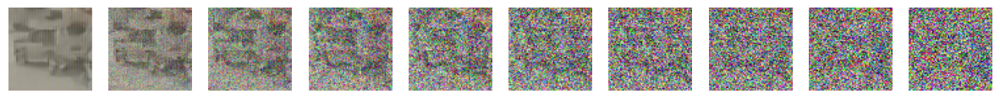

In [28]:
for i in range(10):
    sample_and_plot_image()

From our model output, we can see that there is some generative resembalance to cars with wheels and chassis. Funny enough, it looks like all of them were just in a car crash!

This is the end of this introductory notebook on diffusion models. The dataset has a total of 60k images, so if you want to expand the training from 10k --> anything higher, feel free! Just note the extended training time. The next notebook will involve using an improved U-Net design with residual short-skip connections and attention gates!